In [2]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np 
import pandas as pd
import time

import scipy.stats as scs 
import statsmodels.api as sm


from sklearn.linear_model import LinearRegression, Ridge, Lasso 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold

from IPython.core.display import HTML
from IPython.display import IFrame
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import statsFunctions as sf
import plotly.offline as pyo
import openbrewerydb
from geopy import distance
import pickle

pyo.init_notebook_mode()
%matplotlib inline

In [3]:
df = pd.read_csv(r"./data/cleaned_data.csv")

In [4]:
breweries = pd.read_csv('./data/breweries.csv')

In [14]:
water_quarter = pd.read_csv('./data/water_quarter.csv')

In [17]:
water_quarter.waterfront = water_quarter.waterfront.fillna(0.0)

In [18]:
water_quarter.waterfront.isna().sum()

0

In [19]:
breweries.name

0          Cloudburst Brewing
1          Fremont Brewing Co
2    Holy Mountain Brewing Co
3    Optimism Brewing Company
4      Reuben's Brews Taproom
5        Urban Family Brewing
Name: name, dtype: object

In [20]:
# remove unnamed index column from cleaned_data.csv
df.drop(df.columns[0], axis=1, inplace=True)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,bed_to_bath,has_basement
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,3.000000,0.0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,1.333333,1.0
2,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,1.333333,1.0
3,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,1.500000,0.0
4,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,1.333333,0.0


In [21]:
# remove unnamed index column from breweries.csv
breweries.drop(breweries.columns[0], axis=1, inplace=True)
breweries.head()

,id,name,brewery_type,street,city,state,postal_code,country,longitude,latitude,phone,website_url,updated_at
0,7405,Cloudburst Brewing,micro,2116 Western Ave,Seattle,Washington,98121-2110,United States,-122.345272,47.611614,2066026061,http://www.cloudburstbrew.com,2018-08-24T16:33:34.739Z
1,7475,Fremont Brewing Co,regional,3409 Woodland Park Ave N,Seattle,Washington,98103-8925,United States,-122.344437,47.649192,2064202407,http://www.fremontbrewing.com,2018-08-24T16:35:05.351Z
2,7505,Holy Mountain Brewing Co,micro,1421 Elliott Ave W,Seattle,Washington,98119-3104,United States,-122.374561,47.630828,2064988435,http://holymountainbrewing.com,2018-08-24T16:35:45.468Z
3,7599,Optimism Brewing Company,micro,1158 Broadway,Seattle,Washington,98122-3822,United States,-122.320267,47.612720,2062289227,http://www.optimismbrewing.com,2018-08-11T21:40:22.865Z
4,7639,Reuben's Brews Taproom,micro,5010 14th Ave NW,Seattle,Washington,98107-5113,United States,-122.373247,47.665409,2067842859,http://www.reubensbrews.com,2018-08-24T16:38:39.980Z


In [22]:
df_under_1m = df[df.price < 1000000]
df_under_1m.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,bed_to_bath,has_basement
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,3.000000,0.0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,1.333333,1.0
2,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,1.333333,1.0
3,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,1.500000,0.0
4,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,1.333333,0.0


In [23]:
options = [98155, 98177, 98133, 98155, 98125, 98117, 98103, 98115, 98105, 98102, 98112, 98109, 98107, 98119, 98199, 98122, 98144, 98134, 98108, 98118, 98168, 98106, 98126, 98136, 98116, 98146, 98178, 98121, 98101, 98154, 98104]  
seattle_proper = df[df['zipcode'].isin(options)] 
# seattle_proper

In [24]:
non_city_options = [98028, 98074, 98053, 98003, 98198, 98038, 98007, 98019, 98002, 98040, 98092, 98030, 98052, 98027, 98058, 98001, 98056, 98166, 98023, 98070, 98148, 98042, 98008, 98059, 98004, 98005, 98034, 98075, 98010, 98032, 98045, 98077, 98065, 98029, 98006, 98022, 98033, 98024, 98011, 98031, 98072, 98188, 98014, 98055, 98039]
burbs = df[df['zipcode'].isin(non_city_options)] 
# burbs

In [25]:
'''
px.set_mapbox_access_token(open("mapbox_token.txt").read())
fig = px.scatter_mapbox(df, lat="lat", lon="long", color="price",
                        color_continuous_scale='brwnyl', size_max=15, zoom=9)
# fig2 = px.scatter_mapbox(seattle_proper, lat="lat", lon="long", color="price",
#                         color_continuous_scale='mint', size_max=15, zoom=9)
# fig.add_trace(fig2.data[0])
fig.show()
'''

'\npx.set_mapbox_access_token(open("mapbox_token.txt").read())\nfig = px.scatter_mapbox(df, lat="lat", lon="long", color="price",\n                        color_continuous_scale=\'brwnyl\', size_max=15, zoom=9)\n# fig2 = px.scatter_mapbox(seattle_proper, lat="lat", lon="long", color="price",\n#                         color_continuous_scale=\'mint\', size_max=15, zoom=9)\n# fig.add_trace(fig2.data[0])\nfig.show()\n'

In [26]:
limits = []
for block in sf.gen_range(0, 1600000, 200000):
    limits.append(block)
colors = ["rgb(225,196,164)","rgb(225,196,164)","rgb(225,196,164)","rgb(200,133,119)","rgb(200,133,119)","rgb(153,74,93)","rgb(123,52,80)","rgb(92,35,67)"]
scale = 85000
# scale = 150

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = seattle_proper[(seattle_proper['price'] >= lim[0]) & (seattle_proper['price'] <= lim[1])]
#     [(seattle_proper['price'] >= 0) & (seattle_proper['price'] <= 500000)]
    fig.add_trace(go.Scattermapbox(
            lat=df_sub.lat,
            lon=df_sub.long,
#             mode='markers',
            marker = dict(
            size = df_sub['price']/scale,
            color = colors[i],
#             line_color='rgb(40,40,40)',
#             line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])
        ))

fig.add_trace(go.Scattermapbox(
        lat=burbs.lat,
        lon=burbs.long,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=8,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        hoverinfo='none'
    ))

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        
    ))

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        name="University of Washington Medical Center"
    ))
fig.update_layout(
    title='Seattle proper vs Outer limits',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
        pitch=0,
        zoom=10.2,
        style='dark'
    ),
)

fig.show()

In [27]:
df['coords'] = list(zip(df.lat, df.long))
breweries['coords'] = list(zip(breweries.latitude, breweries.longitude))

In [28]:
distance.distance(df.coords[0], breweries.coords[0]).miles

8.072272203248211

In [29]:
def get_miles(coord1, coord2):
    miles = distance.distance(coord1, coord2).miles
    return round(miles, 2)

In [30]:
for ind,row in breweries.iterrows():
    df[row['name']] = df['coords'].apply(lambda x: get_miles(row.coords, x))

In [31]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'bed_to_bath',
       'has_basement', 'coords', 'Cloudburst Brewing', 'Fremont Brewing Co',
       'Holy Mountain Brewing Co', 'Optimism Brewing Company',
       'Reuben's Brews Taproom', 'Urban Family Brewing'],
      dtype='object')

In [32]:
brew_dist = df.iloc[:,-6:]

In [33]:
brew_dist['closest'] = brew_dist.idxmin(axis=1)

In [34]:
brew_dist['closest_dist'] = brew_dist.min(axis=1)

In [35]:
df['closest'] = brew_dist['closest']
df['closest_dist'] = brew_dist['closest_dist']

In [36]:
optimism = df[(df.closest == 'Optimism Brewing Company') & (df.closest_dist <= 10)]
reubens = df[(df.closest == 'Reuben\'s Brews Taproom') & (df.closest_dist <= 10)]
cloud = df[(df.closest == 'Cloudburst Brewing') & (df.closest_dist <= 10)]
holy = df[(df.closest == 'Holy Mountain Brewing Co') & (df.closest_dist <= 10)]
fremont = df[(df.closest == 'Fremont Brewing Co') & (df.closest_dist <= 10)]
urban = df[(df.closest == 'Urban Family Brewing') & (df.closest_dist <= 10)]


In [37]:
brew_radi_df = df[df.closest_dist <= 3]

In [38]:
brew_radi_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,has_basement,coords,Cloudburst Brewing,Fremont Brewing Co,Holy Mountain Brewing Co,Optimism Brewing Company,Reuben's Brews Taproom,Urban Family Brewing,closest,closest_dist
11,1175000570,3/12/2015,530000.0,5,2.00,1810,4850,1.5,0.0,0.0,...,0.0,"(47.67, -122.394)",4.63,2.72,2.85,5.25,1.02,0.67,Urban Family Brewing,0.67
13,6865200140,5/29/2014,485000.0,4,1.00,1600,4300,1.5,0.0,0.0,...,0.0,"(47.6648, -122.343)",3.68,1.08,2.77,3.75,1.41,2.23,Fremont Brewing Co,1.08
16,6300500875,5/14/2014,385000.0,4,1.75,1620,4980,1.0,0.0,0.0,...,1.0,"(47.7025, -122.341)",6.28,3.69,5.19,6.28,2.97,3.70,Reuben's Brews Taproom,2.97
21,1794500383,6/26/2014,937000.0,3,1.75,2450,2691,2.0,0.0,0.0,...,1.0,"(47.6386, -122.36)",1.99,1.03,0.87,2.58,1.95,2.08,Holy Mountain Brewing Co,0.87
22,3303700376,12/1/2014,667000.0,3,1.00,1400,1581,1.5,0.0,0.0,...,0.0,"(47.6221, -122.314)",1.63,2.35,2.89,0.71,4.07,4.45,Optimism Brewing Company,0.71
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15199,1931300412,4/16/2015,475000.0,3,2.25,1190,1200,3.0,0.0,0.0,...,0.0,"(47.6542, -122.346)",2.94,0.35,2.09,3.11,1.49,2.11,Fremont Brewing Co,0.35
15202,1972201967,10/31/2014,520000.0,2,2.25,1530,981,3.0,0.0,0.0,...,1.0,"(47.6533, -122.346)",2.88,0.29,2.05,3.05,1.52,2.13,Fremont Brewing Co,0.29
15212,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,0.0,"(47.6993, -122.346)",6.06,3.46,4.91,6.10,2.66,3.38,Reuben's Brews Taproom,2.66
15214,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,0.0,"(47.5944, -122.299)",2.47,4.34,4.34,1.61,6.01,6.25,Optimism Brewing Company,1.61


In [39]:
brew_radi_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'bed_to_bath',
       'has_basement', 'coords', 'Cloudburst Brewing', 'Fremont Brewing Co',
       'Holy Mountain Brewing Co', 'Optimism Brewing Company',
       'Reuben's Brews Taproom', 'Urban Family Brewing', 'closest',
       'closest_dist'],
      dtype='object')

In [40]:
fig = px.scatter_mapbox(brew_radi_df, lat="lat", 
                        lon="long", 
                        color="closest_dist", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        
    ))

fig.update_layout(
    title='Seattle proper vs Outer limits',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
        pitch=0,
        zoom=10.2,
        style='dark'
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),

        name="University of Washington Medical Center"
    ))

fig.show()

In [44]:
fig = px.scatter_mapbox(water_quarter, lat="lat", 
                        lon="long", 
                        color="waterfront", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        
    ))

fig.update_layout(
    title='Seattle proper vs Outer limits',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
        pitch=0,
        zoom=10.2,
        style='dark'
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),

        name="University of Washington Medical Center"
    ))

fig.show()

In [41]:
df[df.view == 4]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,has_basement,coords,Cloudburst Brewing,Fremont Brewing Co,Holy Mountain Brewing Co,Optimism Brewing Company,Reuben's Brews Taproom,Urban Family Brewing,closest,closest_dist
379,2998800125,7/1/2014,730000.0,2,2.25,2130,4920,1.5,0.0,4.0,...,1.0,"(47.573, -122.409)",4.00,6.07,4.31,4.97,6.60,6.11,Cloudburst Brewing,4.00
498,1563102435,12/10/2014,950000.0,3,1.75,2150,4200,1.0,0.0,4.0,...,1.0,"(47.5671, -122.405)",4.15,6.34,4.63,5.06,6.95,6.49,Cloudburst Brewing,4.15
503,9273200140,1/21/2015,1310000.0,2,2.25,3950,3938,2.0,0.0,4.0,...,1.0,"(47.5912, -122.384)",2.29,4.41,2.77,3.33,5.15,4.80,Cloudburst Brewing,2.29
722,7855300200,3/19/2015,1240000.0,4,2.75,2680,8500,1.0,0.0,4.0,...,1.0,"(47.5634, -122.156)",9.45,10.61,11.23,8.40,12.36,12.84,Optimism Brewing Company,8.40
955,7663700030,5/3/2015,1180000.0,2,2.50,1770,7155,2.0,1.0,4.0,...,0.0,"(47.7345, -122.285)",8.94,6.51,8.29,8.57,6.30,7.08,Reuben's Brews Taproom,6.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13012,7856400300,7/2/2014,1410000.0,2,2.50,3180,9400,2.0,0.0,4.0,...,1.0,"(47.5617, -122.158)",9.41,10.60,11.19,8.36,12.35,12.82,Optimism Brewing Company,8.36
13434,7351200295,1/14/2015,1150000.0,3,1.75,1760,6788,2.0,1.0,4.0,...,0.0,"(47.7336, -122.284)",8.90,6.48,8.26,8.52,6.29,7.07,Reuben's Brews Taproom,6.29
13566,9523100731,9/30/2014,580000.0,3,2.50,1620,1171,3.0,0.0,4.0,...,1.0,"(47.6681, -122.355)",3.93,1.40,2.73,4.16,0.87,1.73,Reuben's Brews Taproom,0.87
13597,7852090390,4/13/2015,715000.0,4,2.50,3020,7035,2.0,0.0,4.0,...,0.0,"(47.5344, -121.874)",22.67,23.37,24.33,21.55,25.02,25.65,Optimism Brewing Company,21.55


In [42]:
with open('./data/brew_radi_df.pkl', 'wb') as pkl:
    pickle.dump(brew_radi_df, pkl)
# brew_radi_df

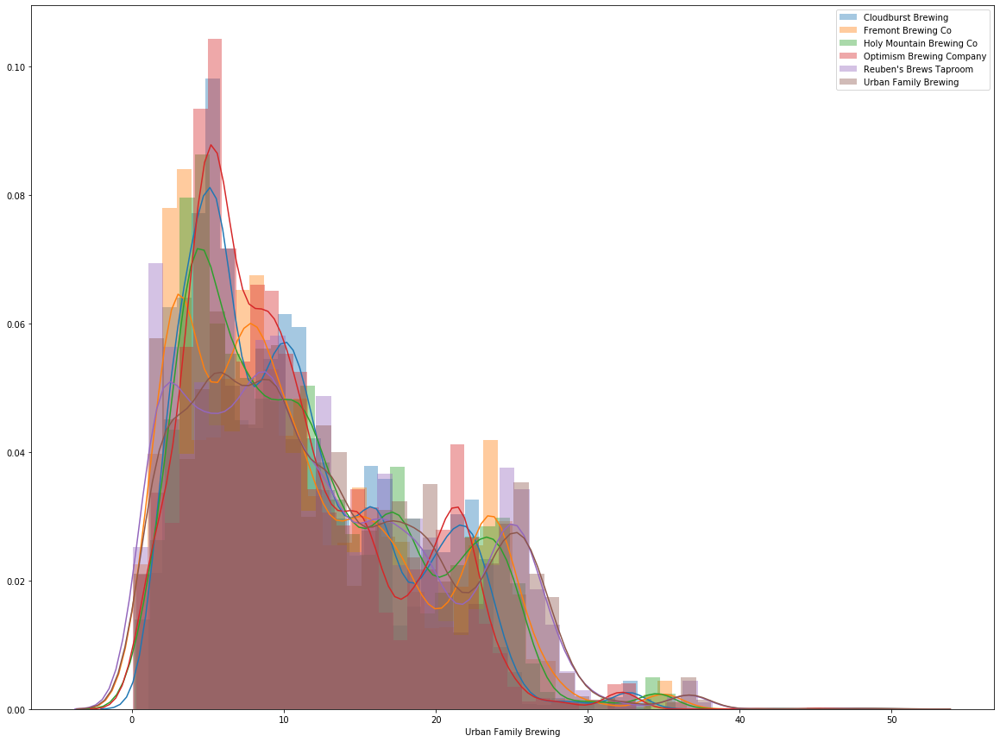

In [43]:
plt.figure(figsize=(20,15))
sns.distplot(df['Cloudburst Brewing'], label='Cloudburst Brewing')
sns.distplot(df['Fremont Brewing Co'], label='Fremont Brewing Co')
sns.distplot(df['Holy Mountain Brewing Co'], label='Holy Mountain Brewing Co')
sns.distplot(df['Optimism Brewing Company'], label='Optimism Brewing Company')
sns.distplot(df['Reuben\'s Brews Taproom'], label='Reuben\'s Brews Taproom')
sns.distplot(df['Urban Family Brewing'], label='Urban Family Brewing')
plt.legend()

In [26]:
scs.shapiro(df['Optimism Brewing Company'])

(0.9271013140678406, 0.0)

In [27]:
def bootstrap(arr):
    return np.random.choice(arr, size=arr.shape, replace=True)

def gen_sample_mus(arr):
    sample_mus = []
    for i in range(num_samples):
        sample = bootstrap(arr)
        mu = np.mean(sample)
        sample_mus.append(mu)
    return sample_mus

In [28]:
sample_cloud = gen_sample_mus

In [29]:
brew_series = [
"df['Cloudburst Brewing']",
"df['Fremont Brewing Co']",
"df['Holy Mountain Brewing Co']",
"df['Optimism Brewing Company']",
"df['Reuben\'s Brews Taproom']",
"df['Urban Family Brewing']"
]

In [30]:
for ind, ser in enumerate(brew_series):
#     print(scs.shapiro(ser))
    print(ser)

df['Cloudburst Brewing']
df['Fremont Brewing Co']
df['Holy Mountain Brewing Co']
df['Optimism Brewing Company']
df['Reuben's Brews Taproom']
df['Urban Family Brewing']


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,has_basement,coords,Cloudburst Brewing,Fremont Brewing Co,Holy Mountain Brewing Co,Optimism Brewing Company,Reuben's Brews Taproom,Urban Family Brewing,closest,closest_dist
379,2998800125,7/1/2014,730000.0,2,2.25,2130,4920,1.5,0.0,4.0,...,1.0,"(47.573, -122.409)",4.00,6.07,4.31,4.97,6.60,6.11,Cloudburst Brewing,4.00
498,1563102435,12/10/2014,950000.0,3,1.75,2150,4200,1.0,0.0,4.0,...,1.0,"(47.5671, -122.405)",4.15,6.34,4.63,5.06,6.95,6.49,Cloudburst Brewing,4.15
503,9273200140,1/21/2015,1310000.0,2,2.25,3950,3938,2.0,0.0,4.0,...,1.0,"(47.5912, -122.384)",2.29,4.41,2.77,3.33,5.15,4.80,Cloudburst Brewing,2.29
722,7855300200,3/19/2015,1240000.0,4,2.75,2680,8500,1.0,0.0,4.0,...,1.0,"(47.5634, -122.156)",9.45,10.61,11.23,8.40,12.36,12.84,Optimism Brewing Company,8.40
955,7663700030,5/3/2015,1180000.0,2,2.50,1770,7155,2.0,1.0,4.0,...,0.0,"(47.7345, -122.285)",8.94,6.51,8.29,8.57,6.30,7.08,Reuben's Brews Taproom,6.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13012,7856400300,7/2/2014,1410000.0,2,2.50,3180,9400,2.0,0.0,4.0,...,1.0,"(47.5617, -122.158)",9.41,10.60,11.19,8.36,12.35,12.82,Optimism Brewing Company,8.36
13434,7351200295,1/14/2015,1150000.0,3,1.75,1760,6788,2.0,1.0,4.0,...,0.0,"(47.7336, -122.284)",8.90,6.48,8.26,8.52,6.29,7.07,Reuben's Brews Taproom,6.29
13566,9523100731,9/30/2014,580000.0,3,2.50,1620,1171,3.0,0.0,4.0,...,1.0,"(47.6681, -122.355)",3.93,1.40,2.73,4.16,0.87,1.73,Reuben's Brews Taproom,0.87
13597,7852090390,4/13/2015,715000.0,4,2.50,3020,7035,2.0,0.0,4.0,...,0.0,"(47.5344, -121.874)",22.67,23.37,24.33,21.55,25.02,25.65,Optimism Brewing Company,21.55


In [111]:
fig = px.scatter(cloud, x="closest_dist", y="price", trendline="ols", trendline_color_override='red')
fig.show()

In [112]:
fig = px.scatter(df, x="closest_dist", y="price", trendline="ols", trendline_color_override='red')
fig.show()

In [61]:
fig = px.scatter(water_quarter, x="sqft_living", y="price", color='waterfront', trendline="ols", trendline_color_override='red')
fig.show()

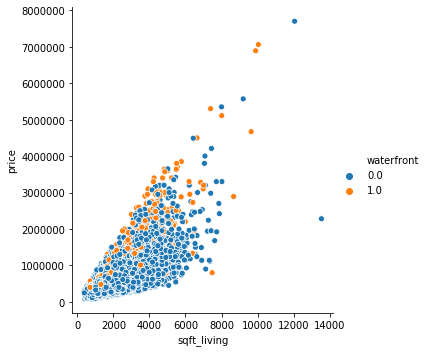

In [59]:
sns.relplot(x='sqft_living', y='price', hue='waterfront', data=water_quarter)

In [57]:
ols = sf.check_model(water_quarter, features_to_use=['waterfront', 'grade'], target_col='price', show_summary=True)
ols

                                 OLS Regression Results                                
Dep. Variable:                  price   R-squared (uncentered):                   0.783
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                          3.896e+04
Date:                Sat, 10 Oct 2020   Prob (F-statistic):                        0.00
Time:                        21:33:33   Log-Likelihood:                     -3.0333e+05
No. Observations:               21597   AIC:                                  6.067e+05
Df Residuals:                   21595   BIC:                                  6.067e+05
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
df.iloc[:,-6:]

In [ ]:
ols = sf.check_model(brew_radi_df, features_to_use=['Optimism Brewing Company', 'grade'], target_col='price', show_summary=True)
ols

In [ ]:
sns.distplot(ols.resid)
fig = sm.graphics.qqplot(ols.resid, dist=scs.norm, line='45', fit=True)

In [ ]:
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(ols, 'Optimism Brewing Company', fig=fig)
plt.show()

In [ ]:
# sns.boxplot(x='grade',y='price',data=df);